# Loi géométrique sur le nombre d'enfants d'un noeud

In [65]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import re

from scipy.stats import geom, chisquare, chi2

## 1. Introduction

Dnas le notebook **Stats_structure_graphes.ipynb**, on avait observé plusieurs caractéristiques sur les enfants et parents d'un noeud. On va maintenant se pencher sur une particularité de certains graphes : la présence d'une loi géométrique sur la fréquence de noeuds à $e$ enfants.

Pour rappel, en théorie des probabilités, la loi géométrique modélise le nombre d’essais nécessaires avant d'obtenir le premier succès dans une suite d’épreuves de Bernoulli indépendantes (répétitions d'une expérience avec deux issues : succès ou échec). Dans notre cas, l'expérience à deux issues corrrespond à : pour chaque nœud, un arc est-il créé entre ce nœud et un potentiel enfant. La formule de la loi géométrique s'écrit : $$p_i = (1 - p)^{i - 1}p$$ pour $i$ de 1 à $+\infty$ et $p_i$ la probabilité d'avoir $i$ enfants.

On va donc commencer par observer les fréquences de noeuds à $e$ enfants.

## 2. Observations sur les enfants

Examinons les ratios entre les fréquences de nœuds à n enfants et les fréquences de nœuds à n + 1 enfants, c'est-à-dire que si on note $e_n$ la fréquence de nœuds ayant n enfants alors on va faire $\frac{e_{n + 1}}{e_n}$. 

Pour le faire, on va tracer les ratios sur un graphique, si on remarque une certaine constance sur un groupe de ratios (disons un groupe d'au moins 7 ratios), cela pourrait suggérer la présence d'une loi géométrique sur ce groupe. On va volontairement tronquer aux noeuds à 20 enfants car la plupart des graphes ne vont pas au delà.

In [4]:
df_enf = pd.read_csv('CSV/GitDAG/stats_enfants.csv').dropna(axis=1)
df_enf

,Type,File name,Nodes count,Leaves count,% leaves,1 child,2 childrens,3 childrens,4 childrens,5 childrens,...,% 22 childrens,% 23 childrens,% 24 childrens,% 25 childrens,% 26 childrens,% 27 childrens,% 28 childrens,% 29 childrens,% 30 childrens,% More than 30
0,small,git.age.tdag,3673,1269,34.5494,1554,558,172,57,30,...,0.0272,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,small,git.answer.tdag,7241,379,5.2341,5305,1242,205,50,23,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,small,git.flink-cdc.tdag,6615,1825,27.5888,3944,387,180,102,64,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0151
3,small,git.fury.tdag,5834,1285,22.0261,3499,719,217,72,29,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,small,git.guacamole-server.tdag,4648,115,2.4742,3962,297,159,72,25,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,large,git.spark.tdag,332366,50481,15.1884,249070,14566,6211,3875,2473,...,0.0060,0.0027,0.0024,0.0021,0.0009,0.0009,0.0015,0.0012,0.0009,0.0159
107,large,git.swift.tdag,265418,14595,5.4989,207053,18504,11017,6164,3431,...,0.0008,0.0011,0.0004,0.0011,0.0000,0.0004,0.0008,0.0004,0.0004,0.0049
108,large,git.symfony.tdag,131646,14398,10.9369,87601,15953,6496,3115,1633,...,0.0023,0.0030,0.0023,0.0015,0.0015,0.0008,0.0008,0.0008,0.0015,0.0182
109,large,git.tensorflow.tdag,261788,20570,7.8575,215109,17385,4653,1635,764,...,0.0008,0.0023,0.0004,0.0004,0.0008,0.0011,0.0015,0.0015,0.0011,0.0103


In [52]:
all_ratio_cols = [f"P(X={i+1})/P(X={i})" for i in range(1, 30)]
keep_ratio_cols = [f"P(X={i+1})/P(X={i})" for i in range(1, 20)]
drop_cols = list(set(all_ratio_cols) - set(keep_ratio_cols))
df_enf_cleaned = df_enf.drop(columns=drop_cols)
cols = keep_ratio_cols

In [60]:
def create_index(df):
    index = dict()
    index_inv = dict()
    for idx, row in df.iterrows():
        index[row["File name"]] = idx
        index_inv[idx] = row["File name"]
    return index, index_inv

def plot_ratios(df, ratio_cols, file_col="File name"):
    for idx, row in df.iterrows():
        ratios = row[ratio_cols].values.astype(float)
        x_labels = [f"P{i+1}/P{i}" for i in range(1, len(ratio_cols) + 1)]
        file_name = row[file_col]
        type_g = row["Type"]

        plt.figure(figsize=(10, 5))
        plt.plot(x_labels, ratios, marker='o')
        plt.title(f"[{idx}] – {file_name} ({type_g})")
        plt.xticks(ticks=x_labels, labels=x_labels, rotation=45)
        plt.ylabel("P(X=i+1) / P(X=i)")
        plt.grid(True)
        plt.tight_layout()

/tmp/ipykernel_4565/1270983806.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 5))


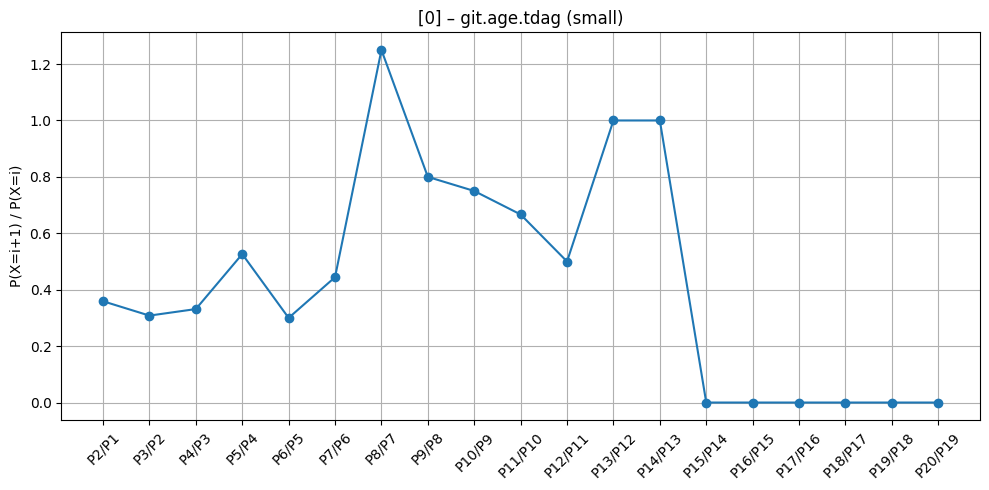

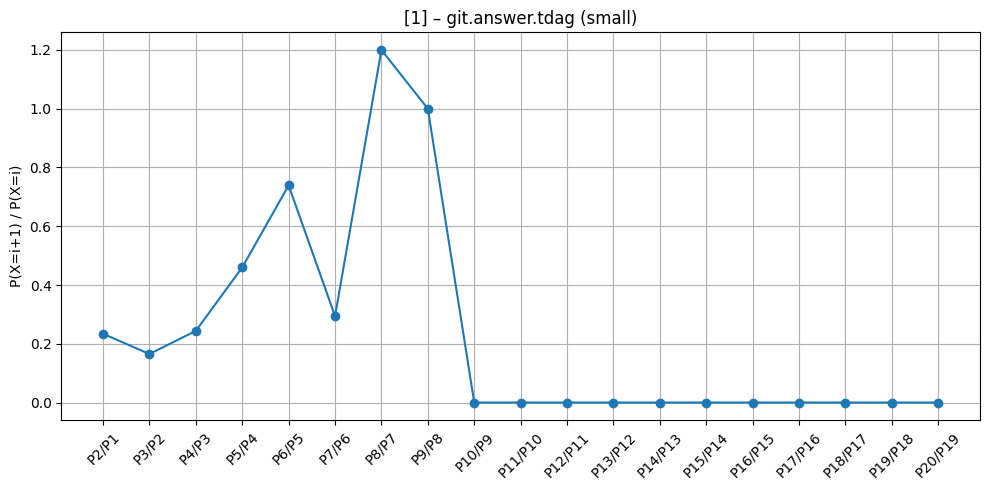

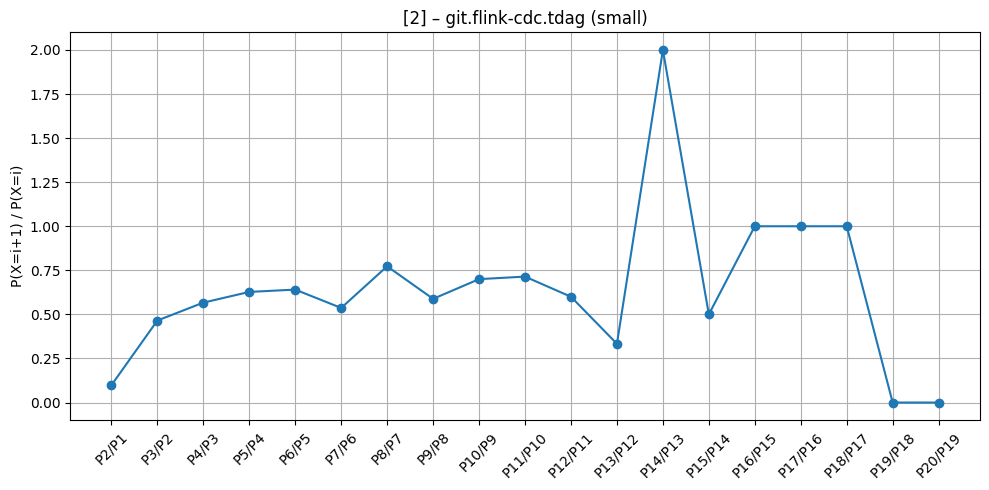

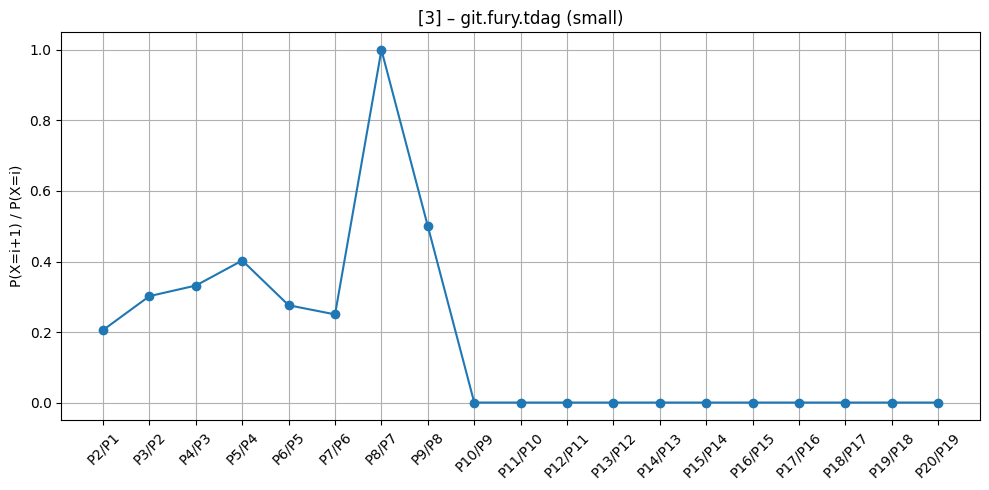

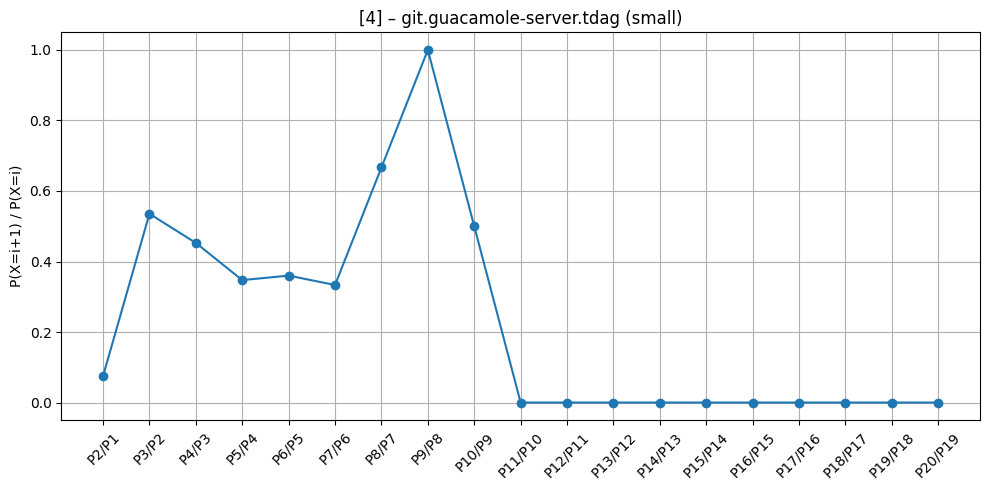

...

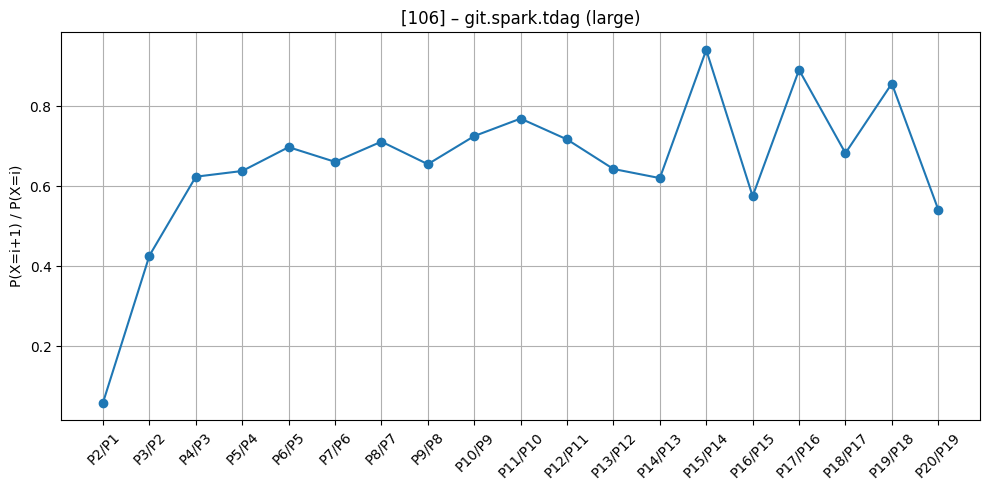

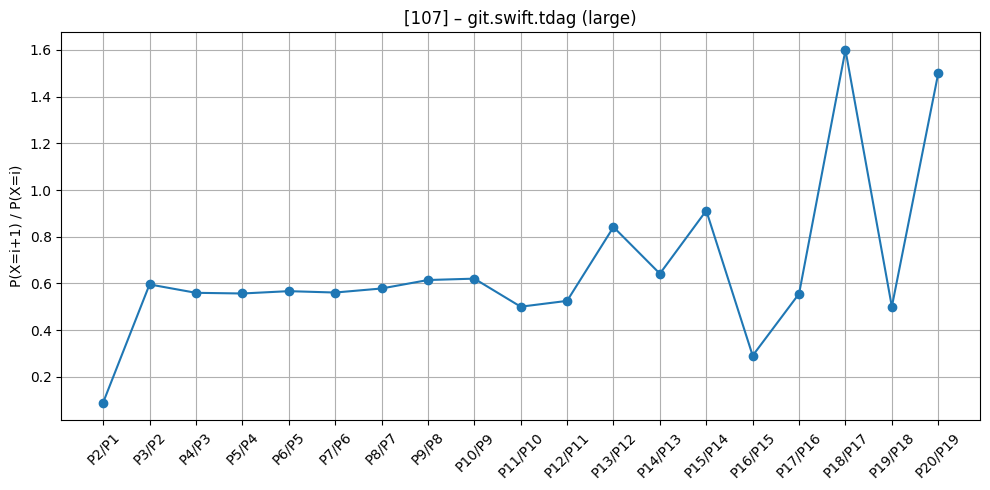

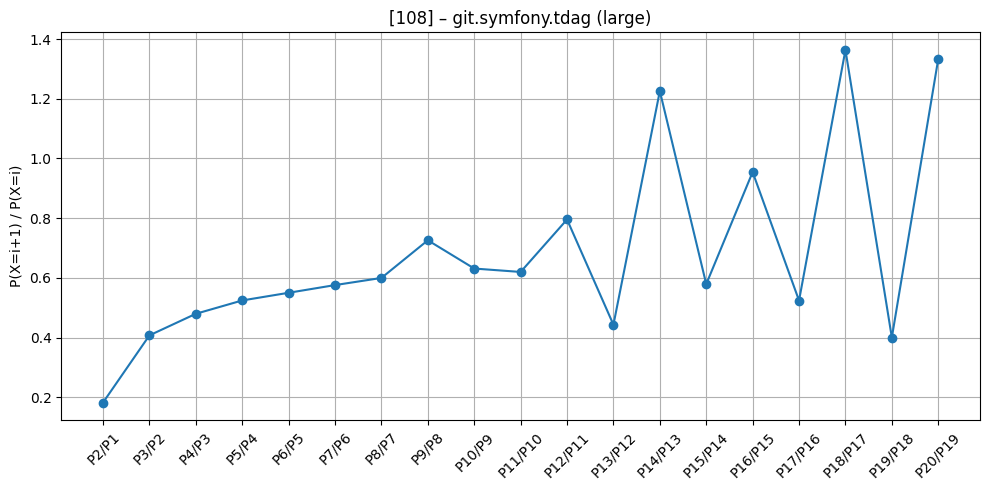

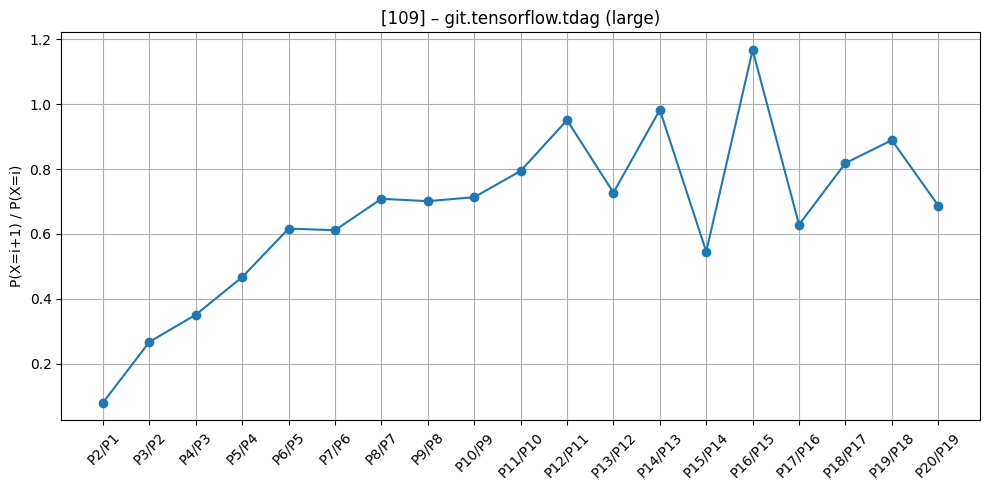

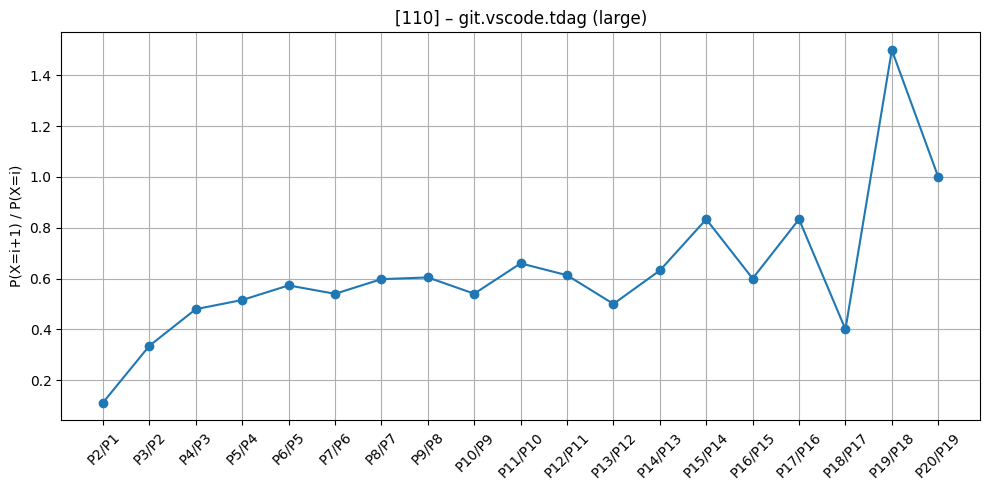

In [19]:
plot_ratios(df_enf, cols)

Sur certains graphes, on observe que les ratios sont plutôt constant (souvent entre P3/P2 et P12/P11). On a donc potentiellement une loi géométrique sur les fréquences. 

## 3. Sélection des candidats

Avant de vérifier la présence de la loi géométrique, on va sélectionner les candidats qui semblent suivre la loi.

In [61]:
index, index_inv = create_index(df_enf)

36


/tmp/ipykernel_4565/1462802709.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 5))


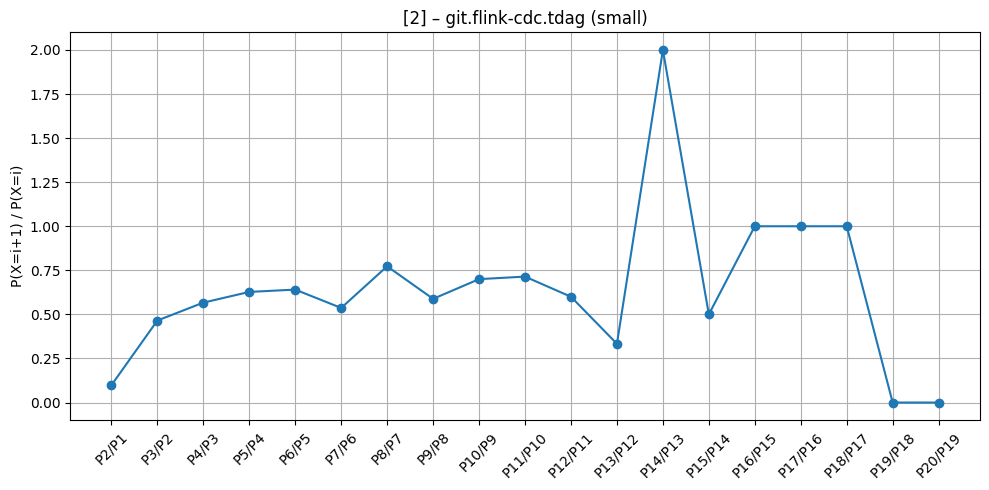

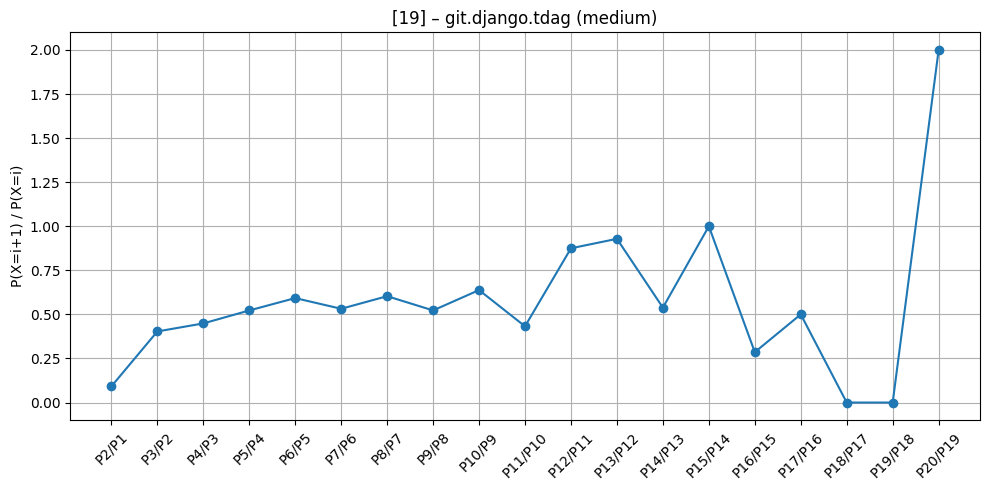

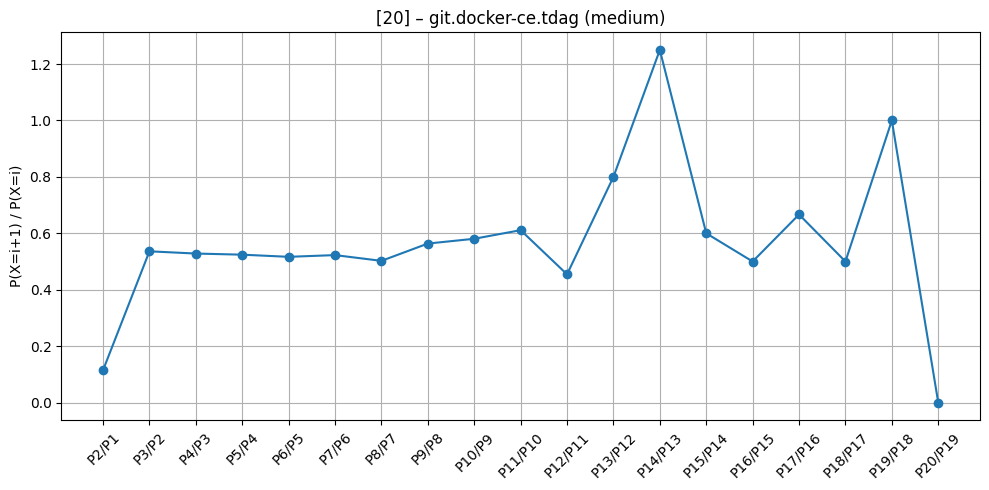

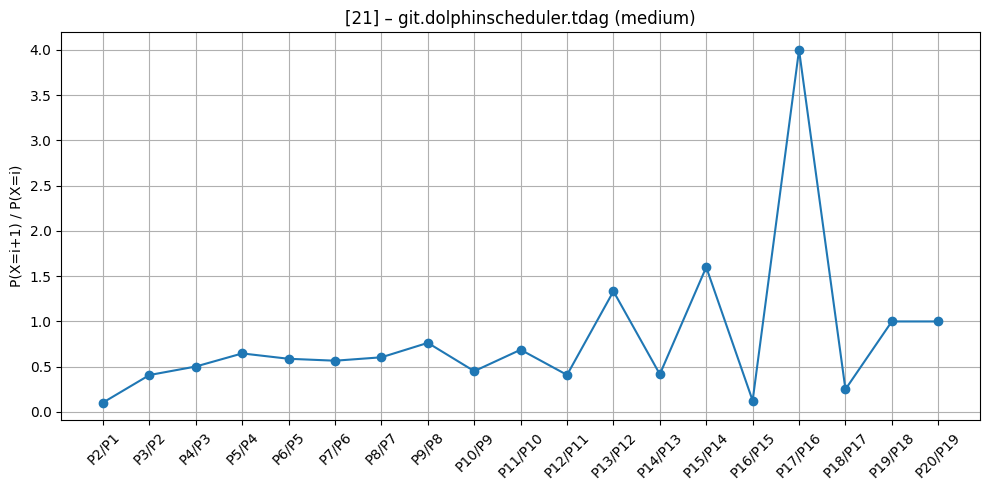

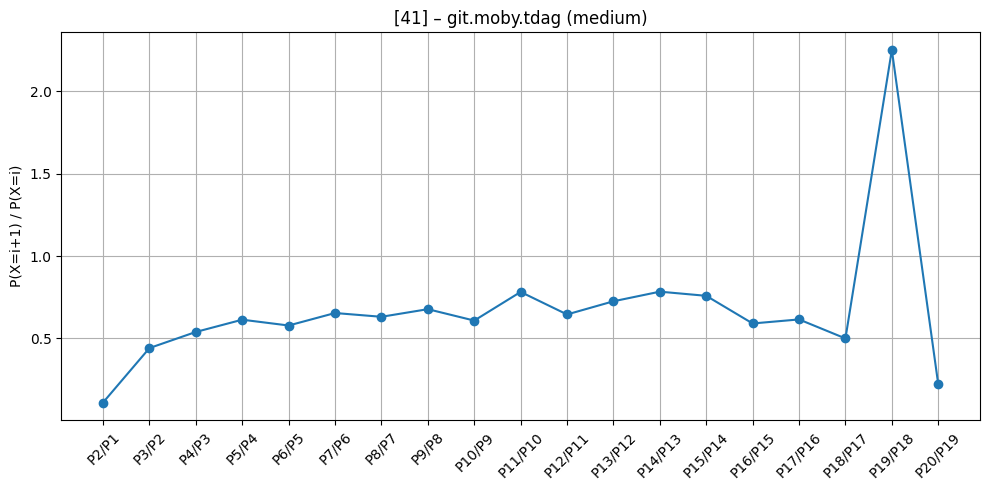

...

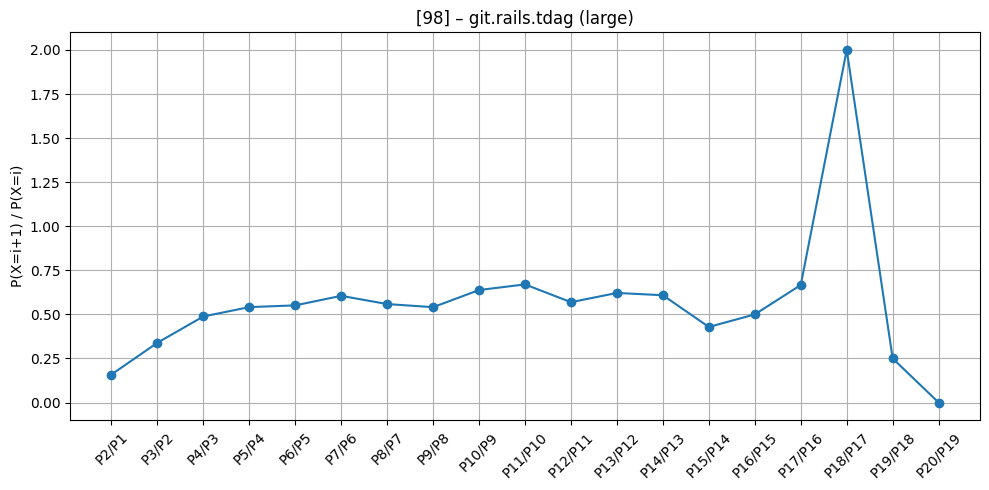

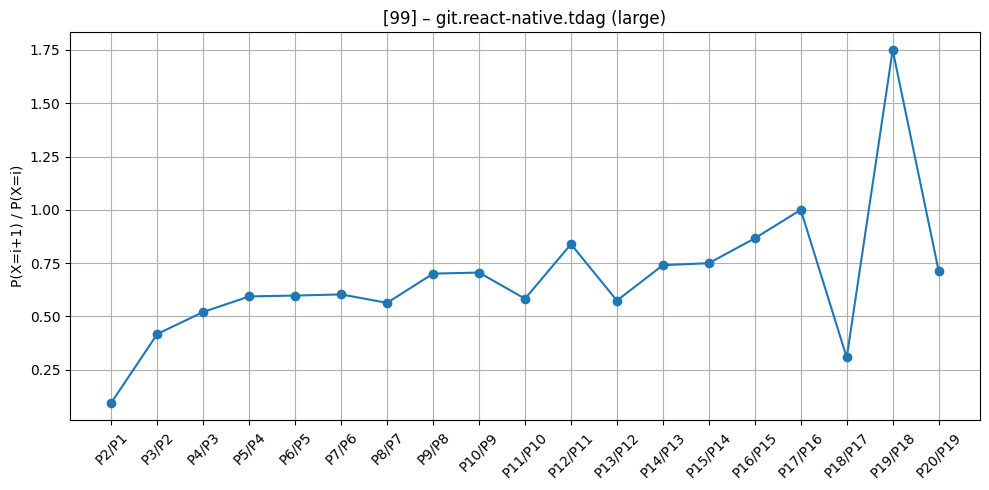

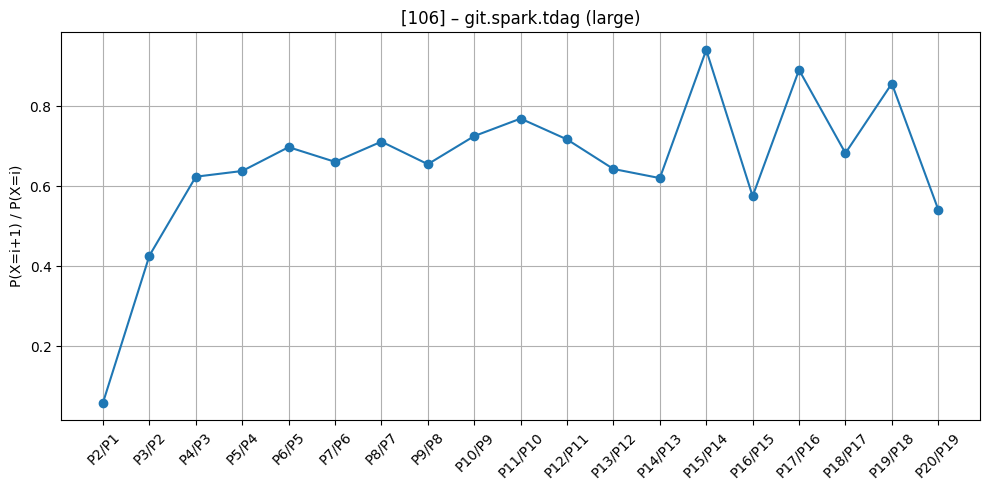

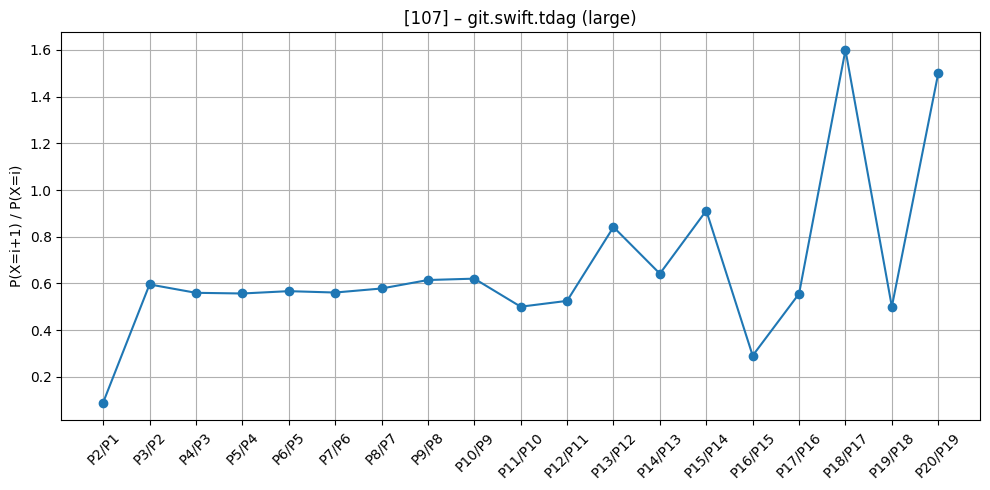

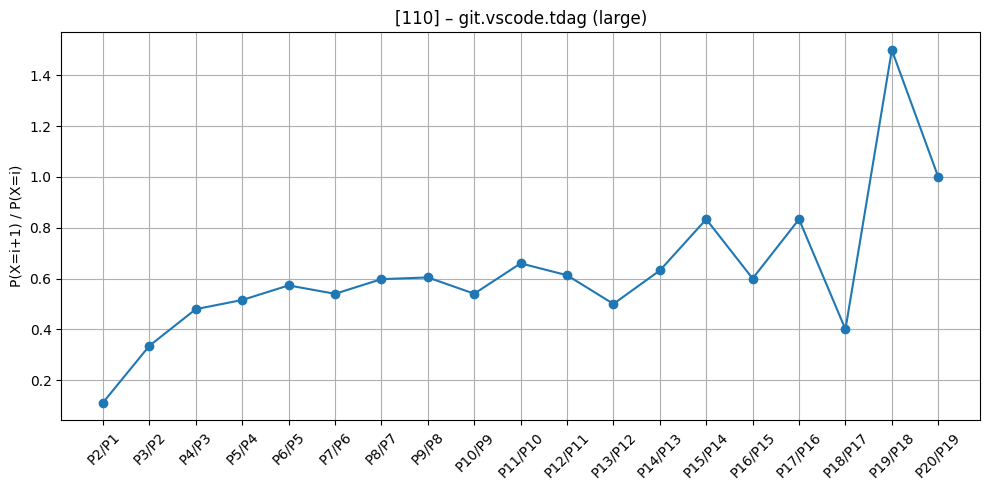

In [73]:
ids = [2, 19, 20, 21, 41, 42, 43, 44, 50, 51, 53, 59, 60, 63, 64, 66, 70, 71, 72, 73, 74, 75, 79, 81, 84, 88, 89, 93, 94, 95, 97, 98, 99, 106, 107, 110]
df_ratios = df_enf_cleaned.iloc[ids]
print(len(df_ratios))
plot_ratios(df_ratios, cols)

On a sélectionné 36 graphes parmis les 110. On se rend compte que leurs ratios sont plutôt constant au début, donc pour les noeuds avec moins de 10 enfants. Il faut maintenant vérifier la présence ou non de la loi géométrique sur les fréquences observées.

## 4. Estimation de p

La 1ère étape de la vérification est d'estimer le paramètre p de la loi géométrique afin de pouvoir générer les valeurs théoriques pour comparer aux observations

Pour une géométrique complète on a : $$p_i = (1 - p)^{i - 1}p$$ avec l'espérance $$\sum_{i=1}^{+\infty} ip_i = \frac{1}{p}$$

Comme on connaît la moyenne (que l'on note $m$) de nos valeurs observées, on pourrait juste réécrire la formule en fonction de $m$ pour estimer $p$ grâce à l'espérance : $p = \frac{1}{m}$. Cependant, on ne peut pas utiliser cette formule car ici, notre fréquence de nœuds est comprise entre 3 et 11, il va donc falloir modifier la formule dans le cas d'une loi géométrique tronquée.

Dans le cas d'une géométrique tronquée de $a$ à T, il faut d'abord renormaliser :  $$q_i =  \frac{(1 - p)^{i - 1}p}{\sum_{i=a}^k (1 - p)^{i - 1}p}$$
On a alors\(Vient de la formule d'une suite géométrique de raison q: $\sum_{k=m}^n u_k = u_m \frac{1 - q^{n - m + 1}}{1 - q}$) :
\begin{align*}
    \sum_{i=a}^k (1 - p)^{i - 1}p &= p\sum_{i=a}^k (1 - p)^{i - 1} \\
    &= p(1 - p)^{a - 1} \times \frac{1 - (1 - p)^{T - a + 1}}{1 - (1 - p)} \\
    &= (1 - p)^{a - 1} \times (1 - (1 - p)^{T - a + 1})
\end{align*}

On obtient alors : $$q_i =  \frac{(1 - p)^{i - 1}p}{(1 - p)^{a - 1}(1 - (1 - p)^{T - a + 1})}$$

On peut en déduire l'espérance :
\begin{align*}
    \sum_{i=a}^T iq_i &= \sum_{i=a}^T i\frac{(1 - p)^{i - 1}p}{(1 - p)^{a - 1}(1 - (1 - p)^{T - a + 1})} \\
    &= \frac{p}{(1 - p)^{a - 1}(1 - (1 - p)^{T - a + 1})} \times  \sum_{i=a}^T i(1 - p)^{i - 1}
\end{align*}

On peut simplifier davantage (On utilise ici : $\sum_{i=1}^{T} i x^{i - 1} = \frac{1 - x^{T+1}}{(1 - x)^2} - (T + 1) \times \frac{x^T}{1 - x}$ issue de la dérivation de la somme géométrique : $\sum_{i=0}^{T} x^i = \frac{1 - x^{T+1}}{1 - x}$) :
\begin{align*}
    \sum_{i=a}^T i(1 - p)^{i - 1} &= \sum_{i=1}^T i(1 - p)^{i - 1} - \sum_{i=1}^{a - 1} i(1 - p)^{i - 1} \\
    &= \left(\frac{1 - (1 - p)^{T + 1}}{p^2} - (T + 1)\frac{(1 - p)^T}{p}\right) - \left(\frac{1 - (1 - p)^{a}}{p^2} - a\frac{(1 - p)^{a - 1}}{p}\right) \\
    &= \frac{(1 - p)^a - (1 - p)^{T + 1}}{p^2} - \frac{(T + 1)(1 - p)^T - a(1 - p)^{a - 1}}{p}
\end{align*}

On peut alors expliciter la formule finale :
\begin{align*}
    \sum_{i=a}^T iq_i &= \frac{p}{(1 - p)^{a - 1}(1 - (1 - p)^{T - a + 1})} \times \left( \frac{(1 - p)^a - (1 - p)^{T + 1}}{p^2} - \frac{(T + 1)(1 - p)^T - a(1 - p)^{a - 1}}{p}\right) \\
    &= \frac{1}{p} \times \frac{(1 - p)^a - (1 - p)^{T + 1}}{(1 - p)^{a - 1}(1 - (1 - p)^{T - a + 1})} - \frac{(T + 1)(1 - p)^T - a(1 - p)^{a - 1}}{(1 - p)^{a - 1}(1 - (1 - p)^{T - a + 1})}
\end{align*}

On se retrouve donc avec une formule précise pour une loi géométrique tronquée, le seul problème, cependant, est qu'il va être compliqué de retrouver une forme $p = f(m)$. On va donc faire autrement pour estimer $p$.

On note $f(p)$ la formule qu'on a trouvé, on alors $f(p) = m$, décroissante. Si on trace cette fonction, on a alors en abscisse $p$ qui va de 0 à 1 et en ordonnée m. L'idée est alors de trouver $p$ par dichotomie sur l'axe des abscisses en connaissant $m$. Par exemple, si l'on prend $p = 0.5$ et que l'on calcule $m_1$ avec $m_1 \leq m$, on prend alors $p = 0.25$ sinon on prend $p = 0.75$. On répète l'opération jusqu'à convergence vers une valeur de $p$ proche de la réalité.

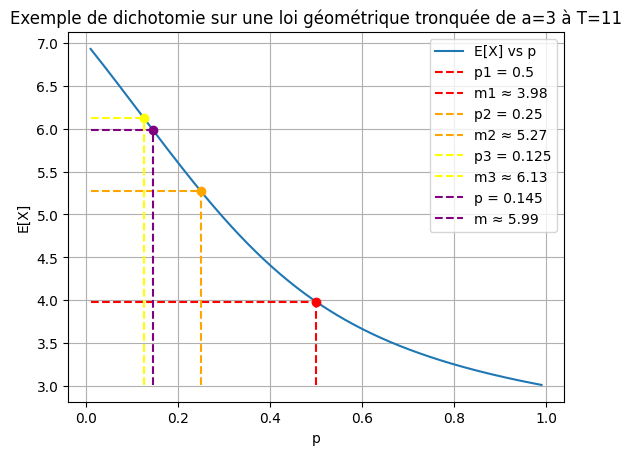

In [83]:
def truncated_geometric(p, a, T):
    denom = ((1 - p)**(a - 1)*(1 - (1 - p)**(T - a + 1)))
    return (1/p)*(((1 - p)**a - (1 - p)**(T + 1))/denom) - (((T + 1)*(1 - p)**T - (a*(1 - p)**(a - 1)))/denom)

def draw_geom_E(a, T):
    p_values = np.linspace(0.01, 0.99, 500)
    esp_values = [truncated_geometric(p, a, T) for p in p_values]

    points = [
        {"p": 0.5, "color": "red", "label": "1"},
        {"p": 0.25, "color": "orange", "label": "2"},
        {"p": 0.125, "color": "yellow", "label": "3"},
        {"p": 0.145, "color": "purple", "label": ""},
    ]
    
    ymin, ymax = min(esp_values), max(esp_values)
    xmin, xmax = min(p_values), max(p_values)

    plt.plot(p_values, esp_values, label="E[X] vs p")

    for point in points:
        p = point["p"]
        color = point["color"]
        label = point["label"]
        m = truncated_geometric(p, a, T)

        plt.vlines(p, ymin, m, color=color, linestyle='--', label=f"p{label} = {p}")
        plt.hlines(m, xmin, p, color=color, linestyle='--', label=f"m{label} ≈ {m:.2f}")
        plt.plot(p, m, 'o', color=color)

    plt.xlabel("p")
    plt.ylabel("E[X]")
    plt.title(f"Exemple de dichotomie sur une loi géométrique tronquée de a={a} à T={T}")
    plt.legend()
    plt.grid(True)
    plt.show()

draw_geom_E(a=3, T=11)

Dans cet exemple, on suppose que m = 0.6, on doit trouver environ $p = 0.145$. On commence à $p_1 = 0.5$, on trouve alors $m_1 = 3.98$. Comme $m_1 \leq m$, on prend $p2 = 0.25$ (sinon on aurait pris $p2 = 0.75$), on compare encore $m_2$ avec $m$ et ainsi de suite. Ici, plus on répète la dichotomie, plus a un $p$ estimé qui se rapproche du vrai p. De plus comme la dichotomie coverge rapidement vers la vraie valeur de $p$, il suffit juste de répéter l'opération une dizaine de fois.

## 5. Vérification de la loi avec test du Khi-deux

On a désormais une méthode pour estimer $p$ et générer les valeurs théoriques pour la comparaison avec les valeurs observées. Maintenant, on va utiliser un test courament utilisé en probabilité : le test du khi-deux d'adéquation.

Le test du khi-deux d'adéquation permet de vérifier si un échantillon d'une variable aléatoire $X$ donne des observations comparables à celles issues d'une loi de probabilité $P$. Ici, la variable aléatoire correspond à la fréquence des nœuds ayant $n$ enfants et la loi de probabilité est la loi géométrique.

Dans le contexte d'un test du khi-deux, on va utiliser un degré de liberté égal à $dl = K - 1 - ne$, avec $ne$ le nombre de variables estimées, donc ici vu que l'on n'estime que $p$, $ne = 1$ et ainsi $dl = K - 2$.

Pour chaque graphe candidat, on va d'abord chercher le groupe de fréquences de noeuds qui correspond le plus à une loi géométrique. On va lister les suites de ratios d'au moins 7 éléments et y associer l'écart type. Enfin, on va prendre la suite avec le plus petit écart type. On va considérer que cette suite est censé suivre le mieux une loi géométrique et c'est donc celle là que l'on va tester avec le test du khi-deux.

En complément du test, on va tracer par graphe, deux courbes : celle des valeurs théoriques et celle des valeurs observées.

Si la p-value calculée grâce au test est inférieure à 0.05, alors on rejette l'hypothèse d'une loi géométrique, sinon on l'accepte.

In [67]:
def clean_list_counts(df, ratio_cols, idx):
    # Cherche la suite de ratios la plus stable
    d = dict()
    lim = 7
    tmp = df.loc[idx][ratio_cols]
    for lim in range(7, len(tmp)):
        for i in range(0, len(tmp) - lim):
            t = df.loc[idx][ratio_cols][i : lim + i]
            d[t.std()] = t
    s = d[min(d)]
    k_vals = [int(re.search(r"P\(X=(\d+)\)/P\(X=(\d+)\)", col).group(1)) for col in s.index]
    min_k, max_k = min(k_vals), max(k_vals)
    cols = [f"{i} childrens" for i in range(min_k, max_k + 1)]
    return min_k, max_k, df.loc[idx][cols]
    
def approx_p(m, a, T, max_iter=100):
    p_min = 0
    p_max = 1
    for i in range(max_iter):
        p = (p_min + p_max) / 2
        m_tmp = truncated_geometric(p, a, T)
        if m_tmp <= m:
            p_max = p
        else:
            p_min = p
    return p

def test_geometric_law(counts, min_k, max_k, label=''):
    counts = np.array(counts, dtype=np.float64)
    k_vals = np.arange(min_k, max_k + 1) # min enfants à max enfants -> exemple : de 3 à 10 enfants

    # Probabilités empiriques
    observed_probs = counts / counts.sum()

    # Estimation de p (par moyenne empirique)
    mean_k = np.sum(k_vals * observed_probs)
    p_hat = approx_p(mean_k, min_k, max_k)

    # Probabilités théoriques tronquées
    theoretical_probs_raw = geom.pmf(k_vals, p=p_hat) # fonction de masse de probabilité (= fonction de la loi géométrique)
    theoretical_probs = theoretical_probs_raw / theoretical_probs_raw.sum()  # renormalisation pour que la somme fasse 1

    # Comptes attendus
    expected_counts = theoretical_probs * counts.sum()

    # Test du χ²
    chi2_stat, p_value = chisquare(counts, f_exp=expected_counts, ddof=1)

    pk = list(observed_probs)
    pk_hat = list(theoretical_probs)
    test = sum(counts)*sum([(pk[i] - pk_hat[i])**2 / pk_hat[i] for i in range(len(pk))])

    # Affichage du graphe
    plt.figure(figsize=(8, 5))
    plt.plot(k_vals, observed_probs, 'o-', label="Empirique")
    plt.plot(k_vals, theoretical_probs, 'x--', label=f"Géométrique (p ≈ {p_hat:.3f})")
    plt.xlabel("k (nombre d'enfants)")
    plt.ylabel("Probabilité")
    plt.title(f"{label}")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    n = sum(counts)
    
    if p_value >= 0.05:
        print("ACCEPTEE")
    else:
        print("REFUSEE")

    # Résultats
    print(f"p estimé : {p_hat:.4f}")
    print(f"χ² = {chi2_stat:.2f}, p-value = {p_value:.4f}")

    return p_hat, chi2_stat, p_value


ACCEPTEES :  31 / 36


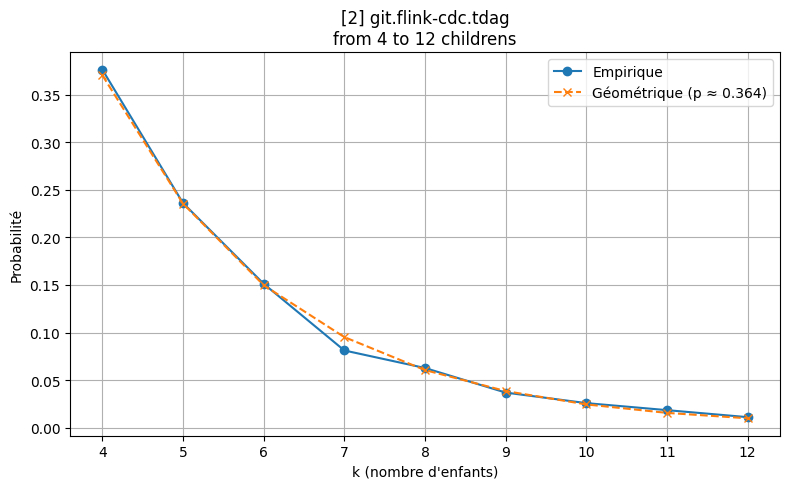

ACCEPTEE
p estimé : 0.3642
χ² = 0.83, p-value = 0.9971


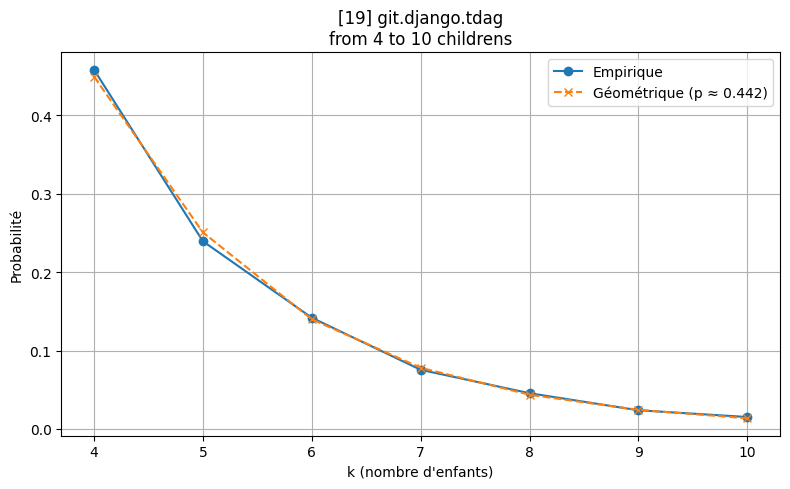

ACCEPTEE
p estimé : 0.4422
χ² = 2.67, p-value = 0.7506


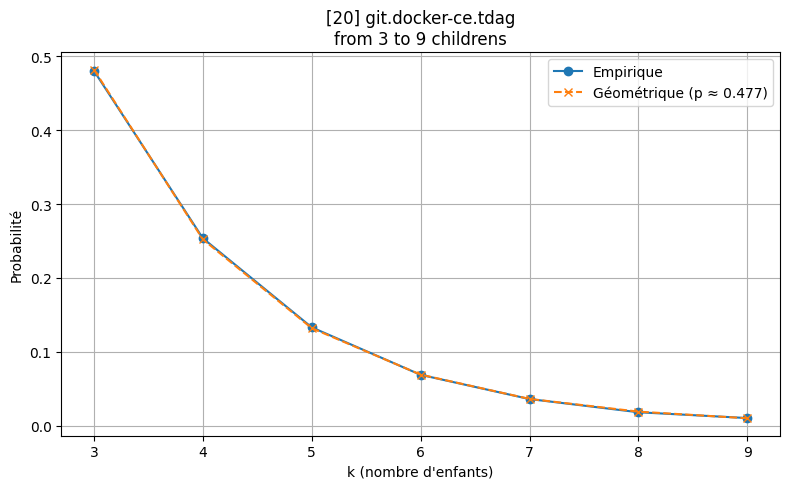

ACCEPTEE
p estimé : 0.4770
χ² = 0.44, p-value = 0.9941


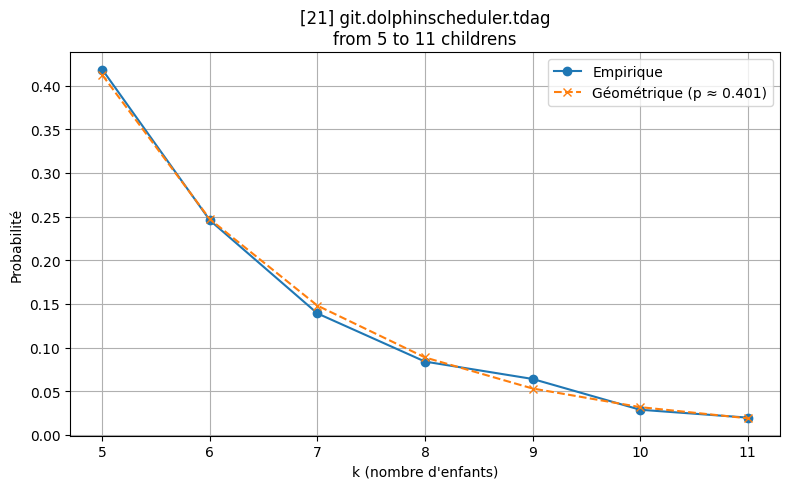

ACCEPTEE
p estimé : 0.4005
χ² = 3.82, p-value = 0.5756


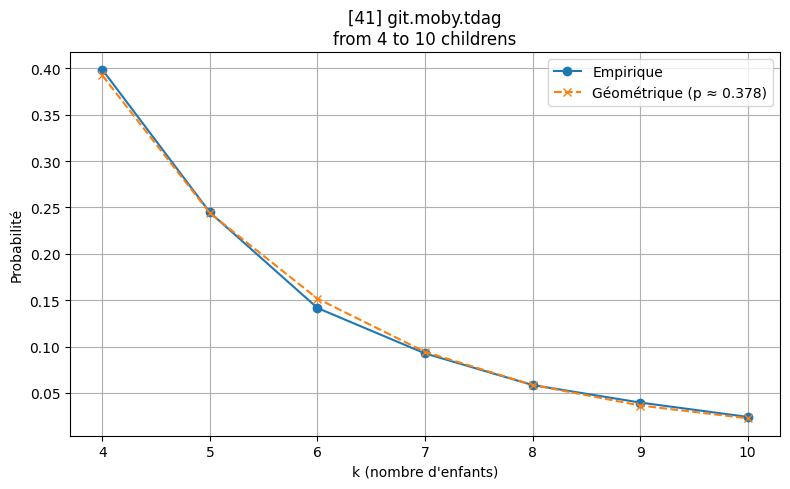

ACCEPTEE
p estimé : 0.3783
χ² = 4.93, p-value = 0.4245


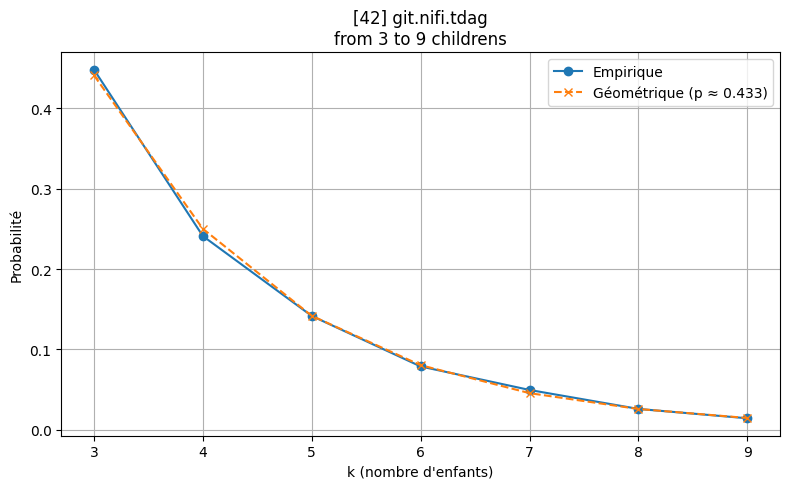

ACCEPTEE
p estimé : 0.4330
χ² = 2.48, p-value = 0.7791


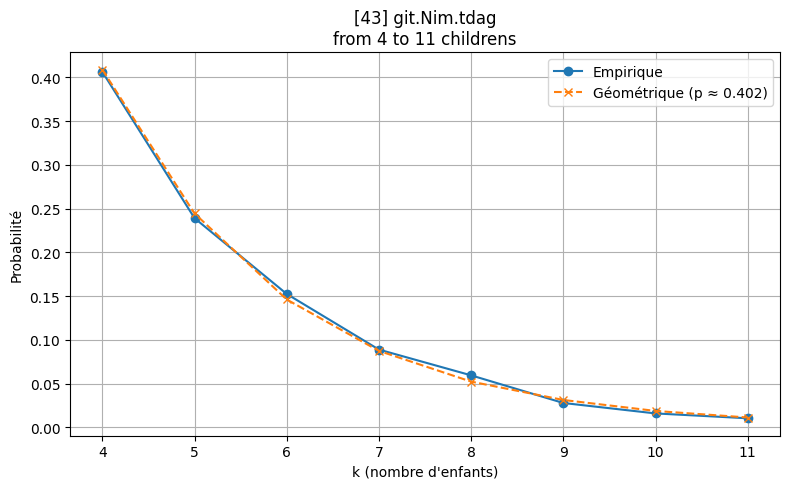

ACCEPTEE
p estimé : 0.4023
χ² = 5.39, p-value = 0.4954


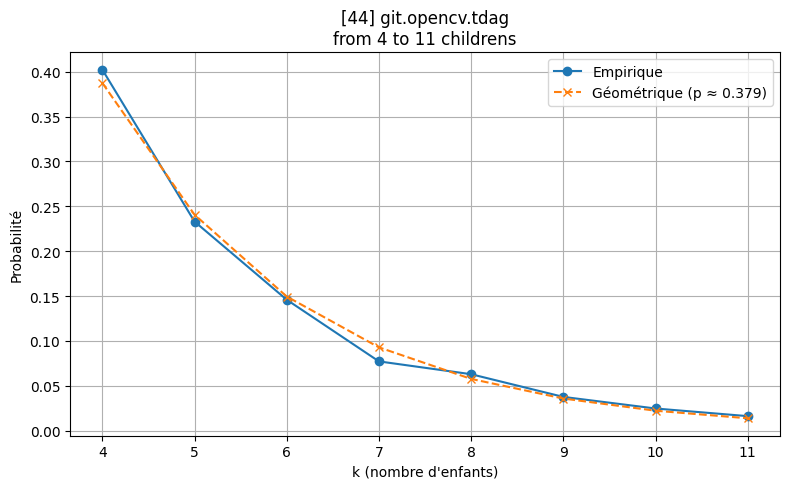

REFUSEE
p estimé : 0.3788
χ² = 17.43, p-value = 0.0078


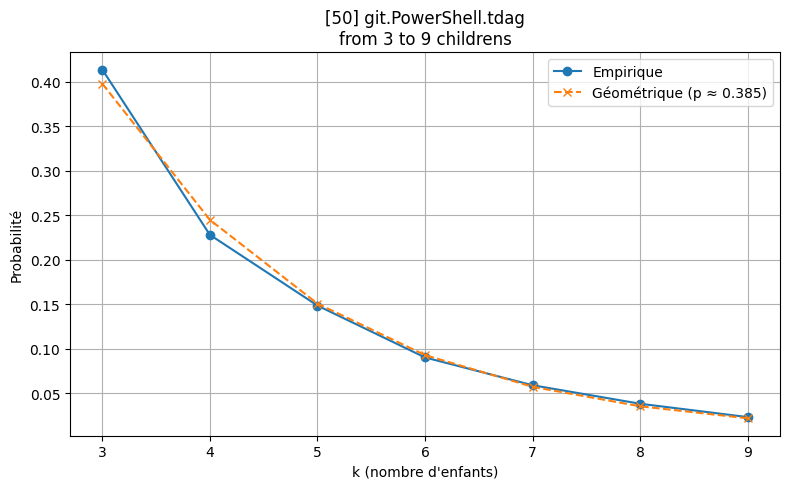

ACCEPTEE
p estimé : 0.3848
χ² = 5.46, p-value = 0.3627


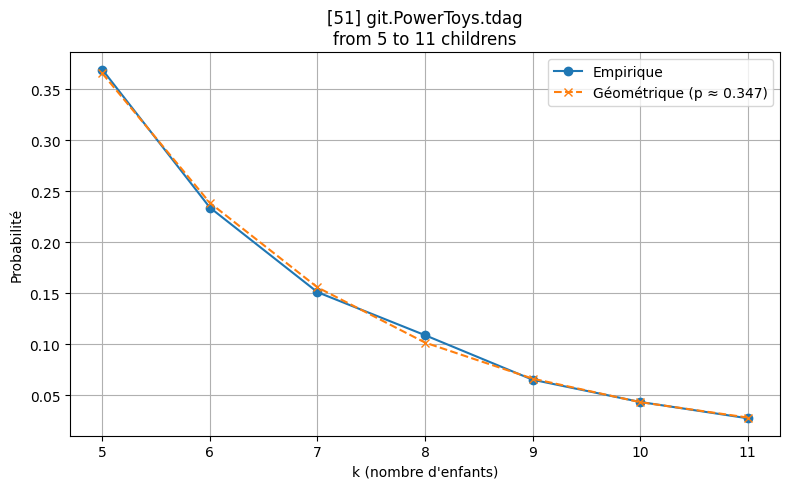

ACCEPTEE
p estimé : 0.3470
χ² = 0.56, p-value = 0.9896


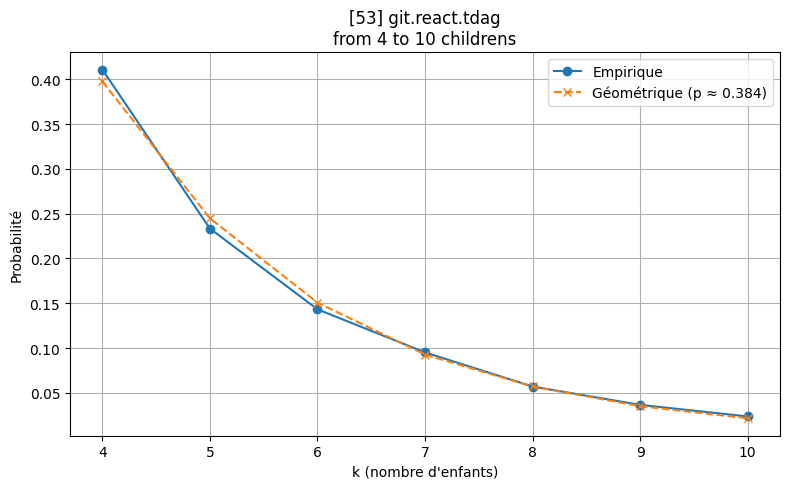

ACCEPTEE
p estimé : 0.3843
χ² = 4.59, p-value = 0.4681


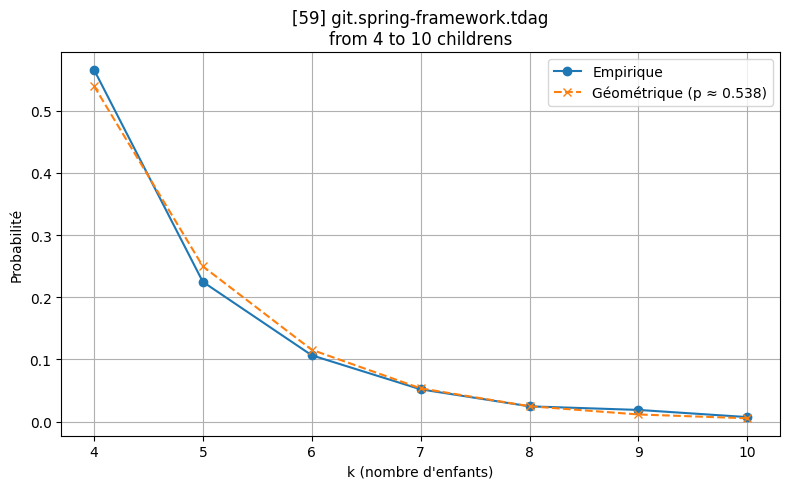

ACCEPTEE
p estimé : 0.5375
χ² = 6.85, p-value = 0.2319


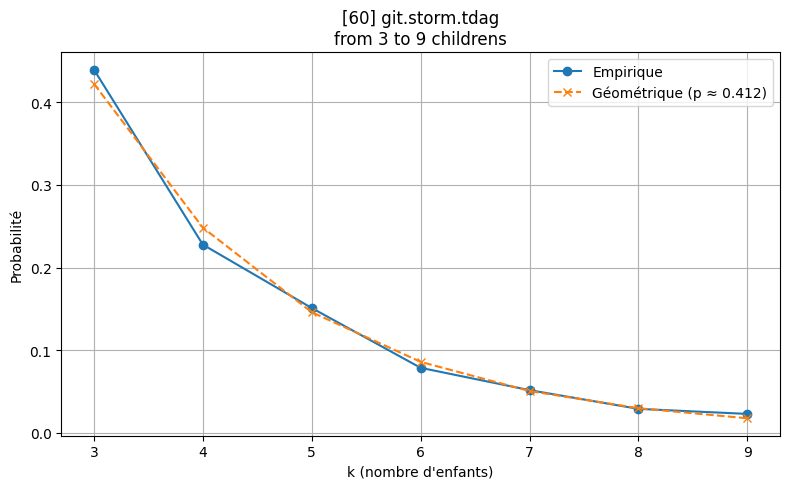

ACCEPTEE
p estimé : 0.4124
χ² = 5.55, p-value = 0.3529


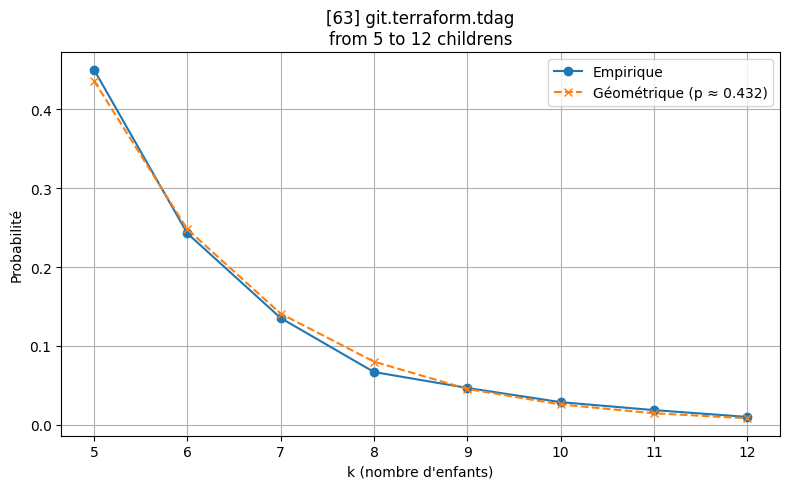

ACCEPTEE
p estimé : 0.4315
χ² = 6.58, p-value = 0.3615


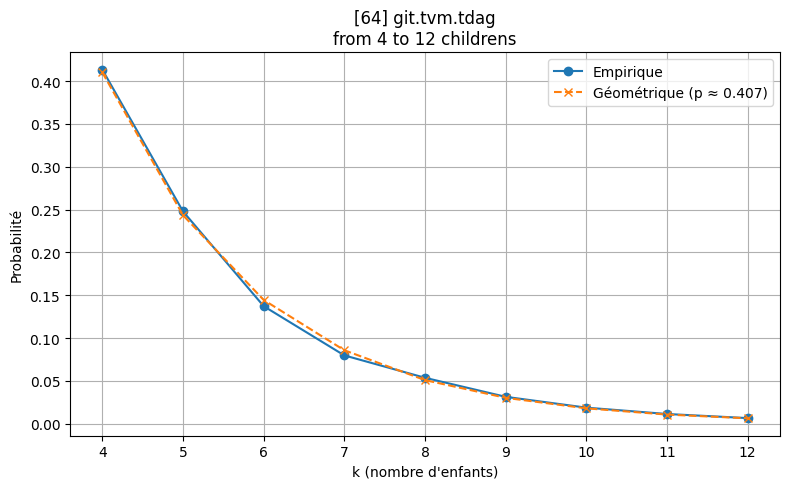

ACCEPTEE
p estimé : 0.4065
χ² = 2.69, p-value = 0.9125


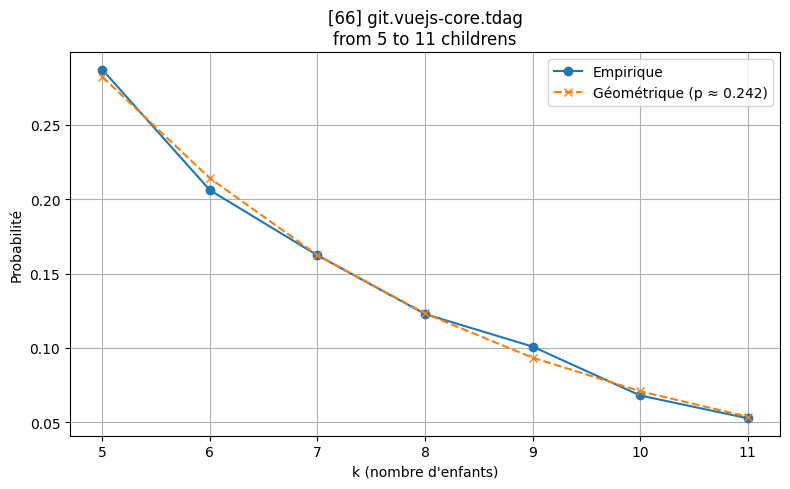

ACCEPTEE
p estimé : 0.2417
χ² = 0.51, p-value = 0.9917


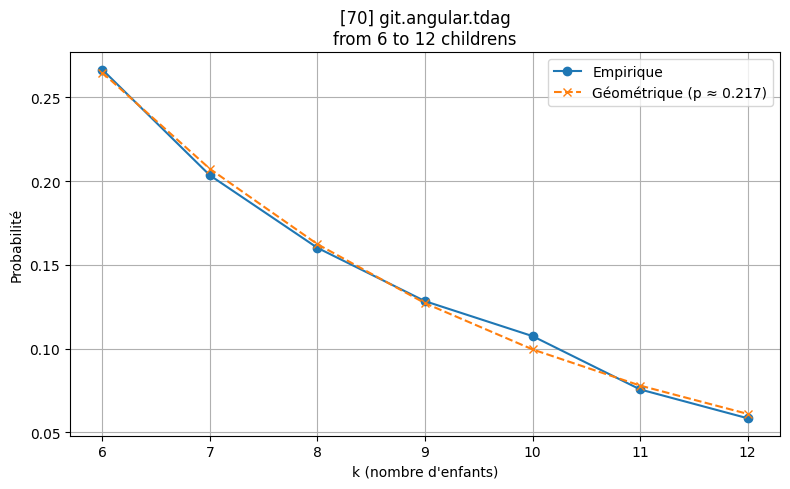

ACCEPTEE
p estimé : 0.2170
χ² = 1.79, p-value = 0.8769


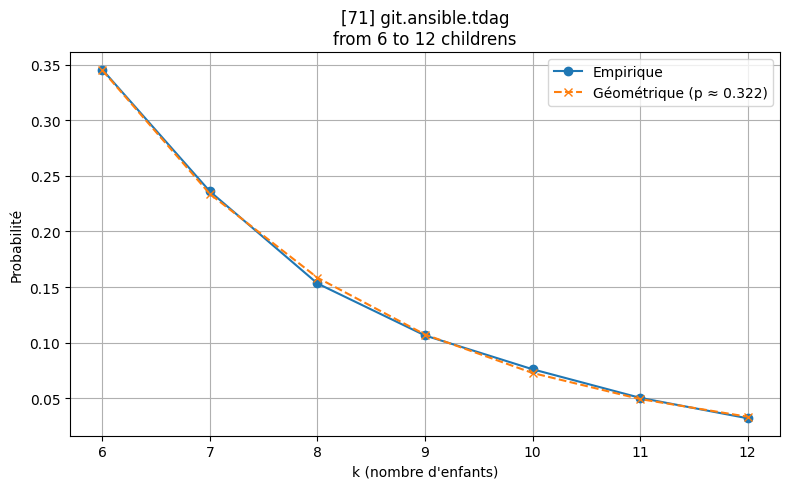

ACCEPTEE
p estimé : 0.3223
χ² = 1.30, p-value = 0.9346


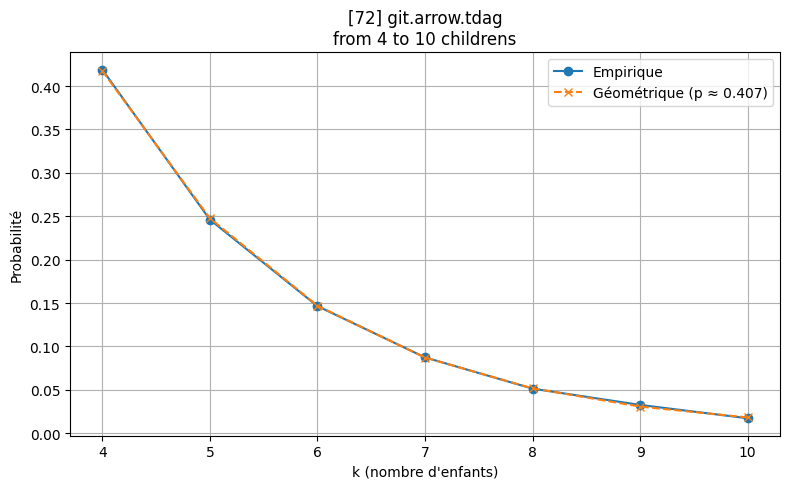

ACCEPTEE
p estimé : 0.4067
χ² = 0.63, p-value = 0.9867


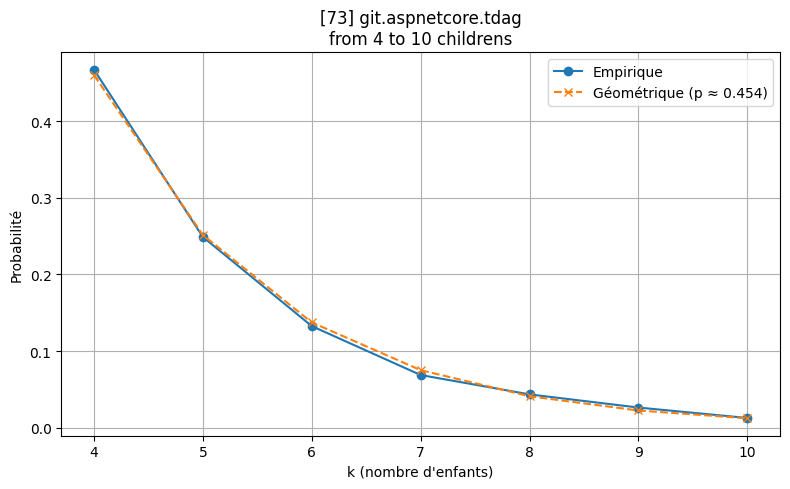

ACCEPTEE
p estimé : 0.4536
χ² = 5.12, p-value = 0.4017


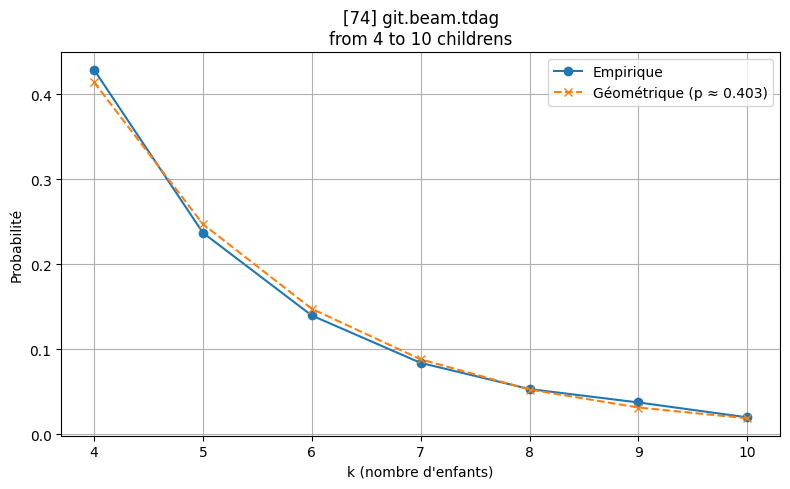

REFUSEE
p estimé : 0.4031
χ² = 15.65, p-value = 0.0079


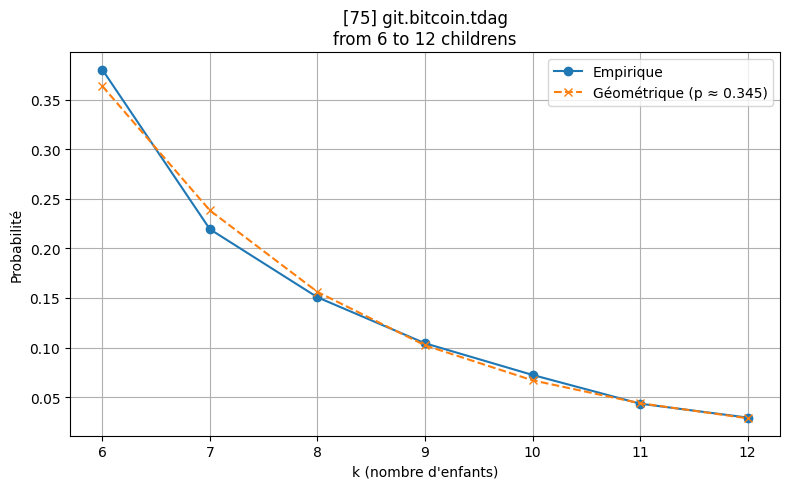

ACCEPTEE
p estimé : 0.3447
χ² = 6.11, p-value = 0.2961


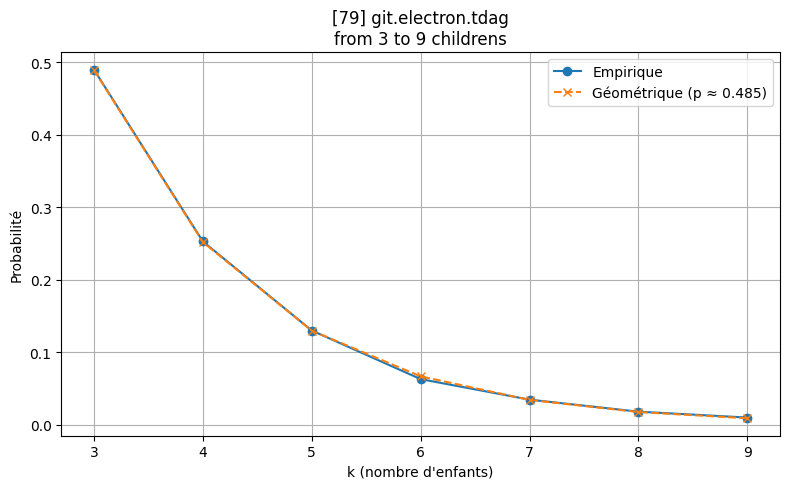

ACCEPTEE
p estimé : 0.4846
χ² = 2.38, p-value = 0.7942


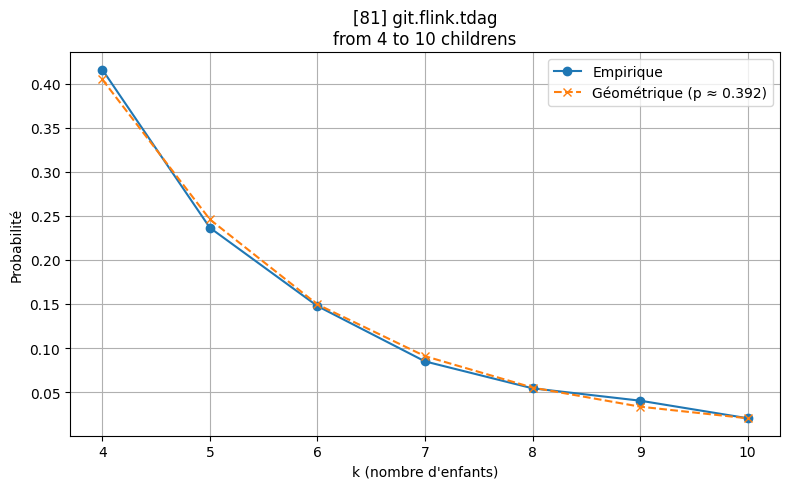

ACCEPTEE
p estimé : 0.3922
χ² = 10.07, p-value = 0.0734


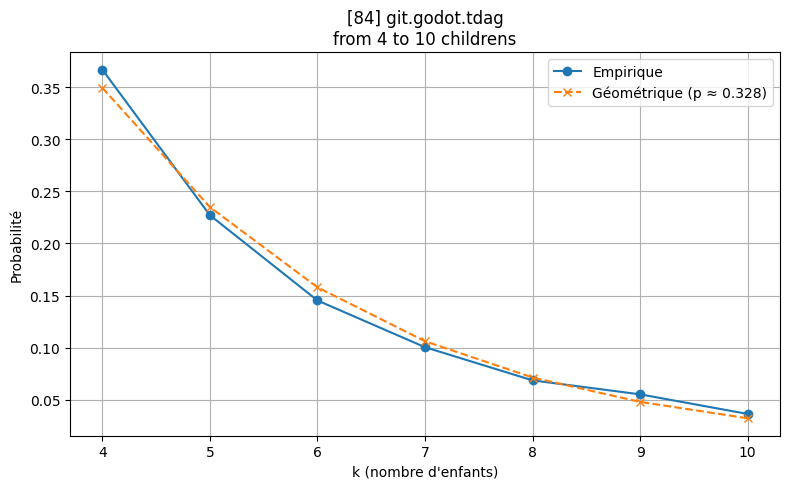

REFUSEE
p estimé : 0.3277
χ² = 20.88, p-value = 0.0009


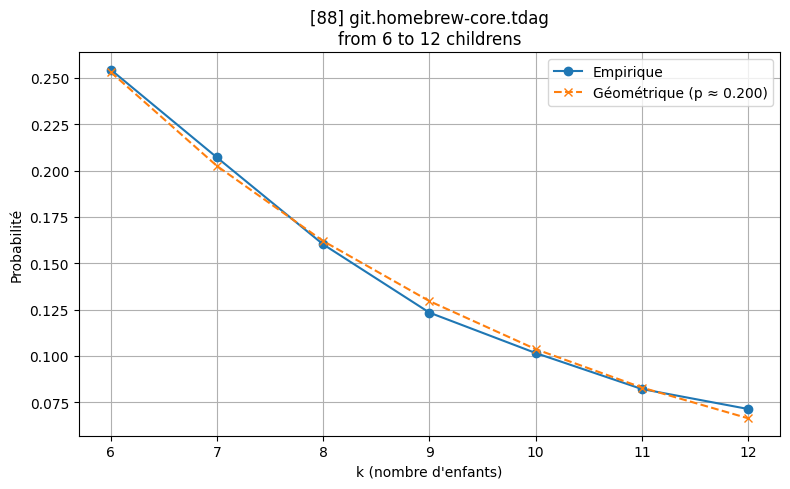

ACCEPTEE
p estimé : 0.2002
χ² = 9.71, p-value = 0.0838


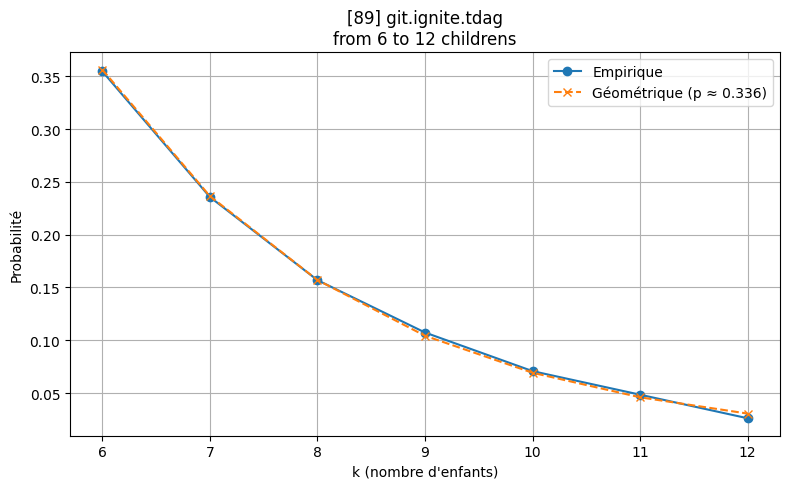

ACCEPTEE
p estimé : 0.3363
χ² = 1.47, p-value = 0.9167


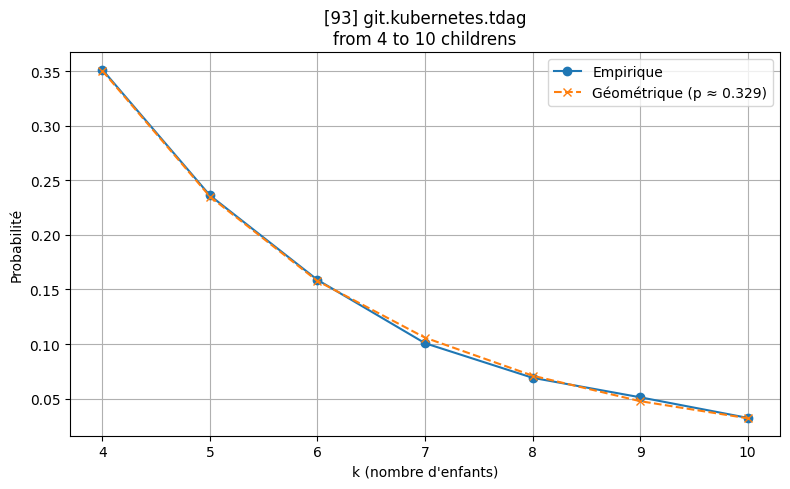

ACCEPTEE
p estimé : 0.3290
χ² = 7.98, p-value = 0.1571


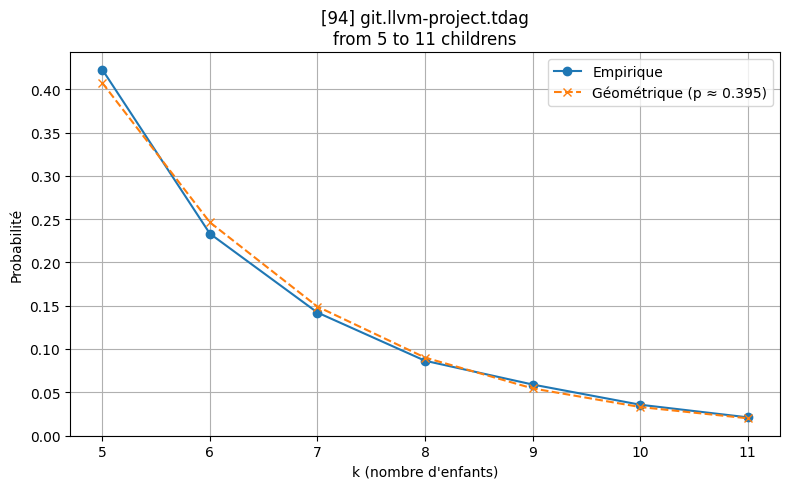

REFUSEE
p estimé : 0.3954
χ² = 32.36, p-value = 0.0000


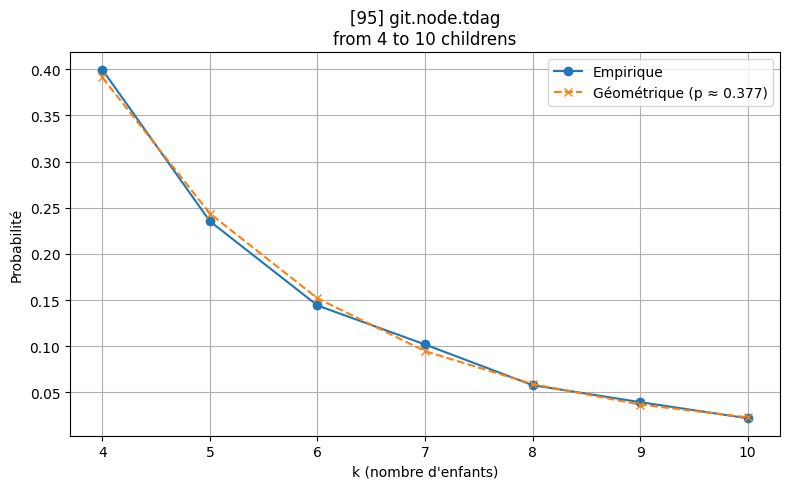

ACCEPTEE
p estimé : 0.3770
χ² = 9.20, p-value = 0.1013


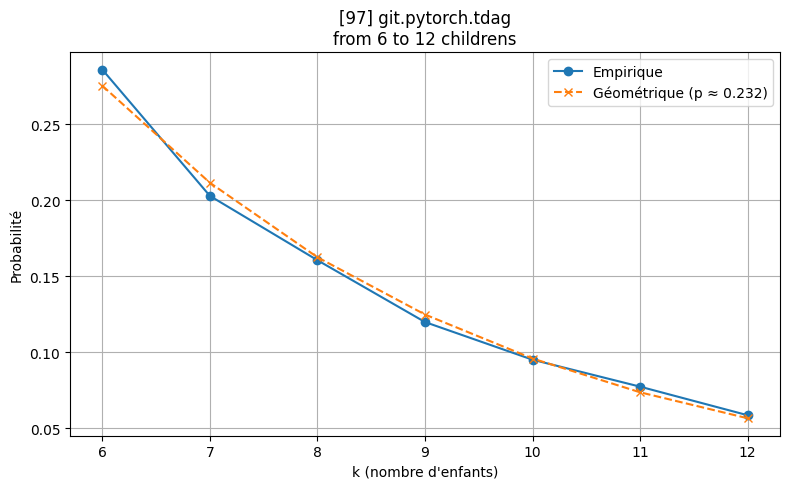

REFUSEE
p estimé : 0.2318
χ² = 12.92, p-value = 0.0241


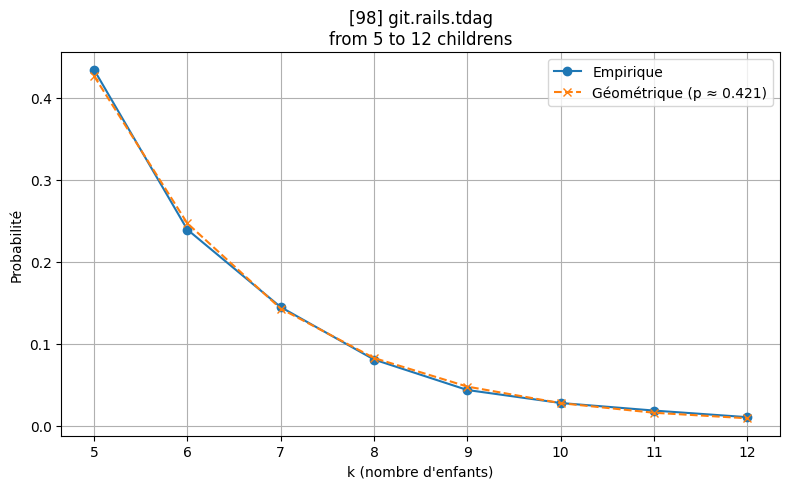

ACCEPTEE
p estimé : 0.4210
χ² = 5.00, p-value = 0.5441


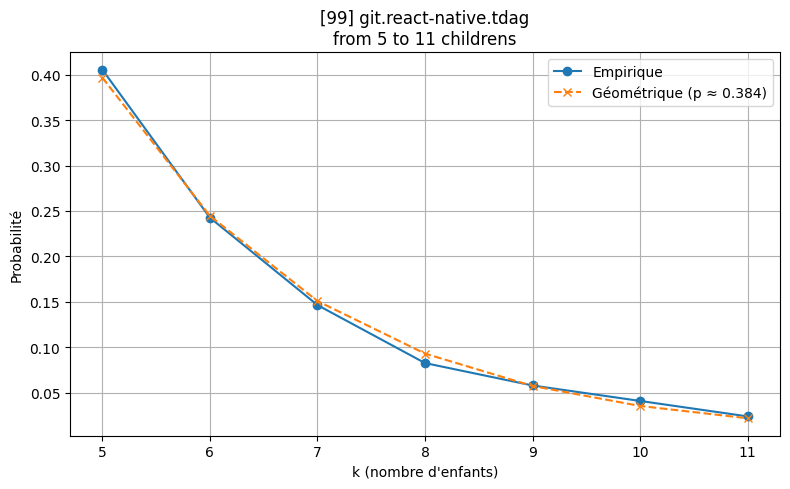

ACCEPTEE
p estimé : 0.3835
χ² = 6.03, p-value = 0.3033


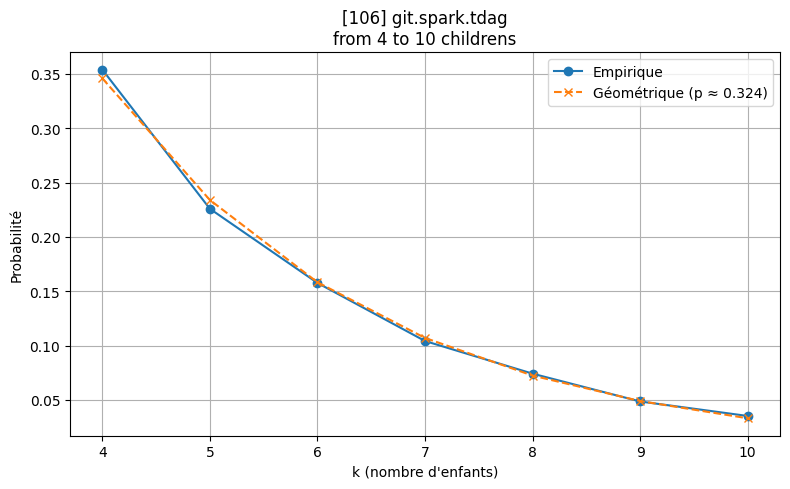

ACCEPTEE
p estimé : 0.3236
χ² = 7.95, p-value = 0.1591


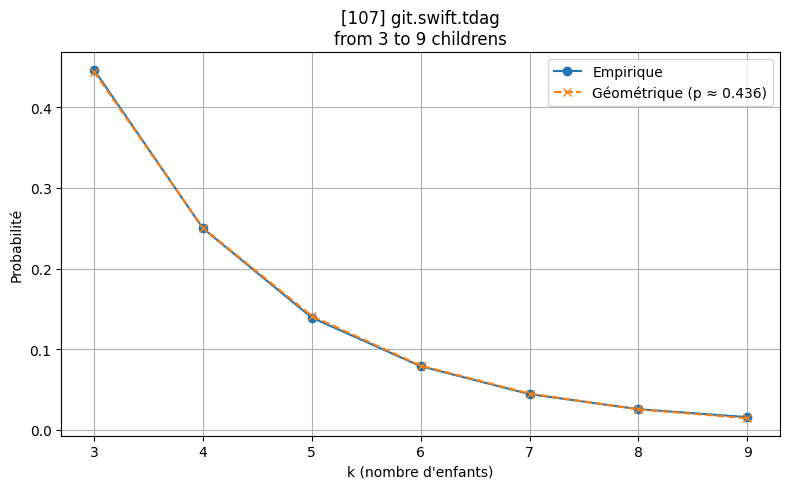

ACCEPTEE
p estimé : 0.4362
χ² = 5.15, p-value = 0.3983


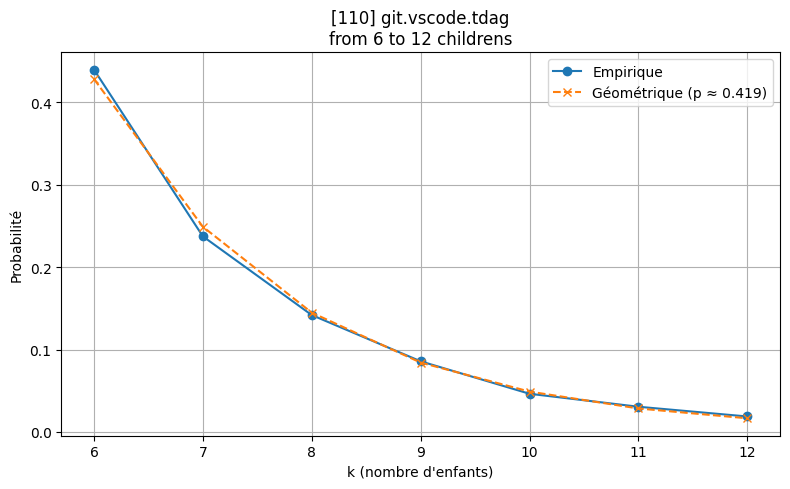

ACCEPTEE
p estimé : 0.4186
χ² = 3.09, p-value = 0.6868


In [77]:
all_ratio_cols_2 = [f"P(X={i+1})/P(X={i})" for i in range(1, 30)]
keep_ratio_cols_2 = [f"P(X={i+1})/P(X={i})" for i in range(2, 13)]
drop_cols_ratios = list(set(all_ratio_cols_2) - set(keep_ratio_cols_2))
df_cleaned_ratios = df_enf.drop(columns=drop_cols_ratios).iloc[ids]
cols_ratios = keep_ratio_cols_2

print("\nACCEPTEES : ", len(acc), "/", len(df_cleaned_ratios))
acc = list()
px = list()
for idx, _ in df_cleaned_ratios.iterrows():
    min_k, max_k, counts = clean_list_counts(df_cleaned_ratios, cols_ratios, idx)
    p, _, p_value = test_geometric_law(counts, min_k, max_k, f"[{idx}] {index_inv[idx]}\nfrom {min_k} to {max_k} childrens")
    if p_value >= 0.05:
        acc.append(idx)
        px.append(p)

D'après le test du khi-deux, on a donc 31 graphes avec une propriété de loi géométrique sur les 36 sélectionnés. Même au niveau des courbes, on observe que les fréquences de noeuds observées sont très proches des théoriques.

La loi géométrique se situe en majorité entre les fréquences de noeuds à 3 enfants et 12 enfants.

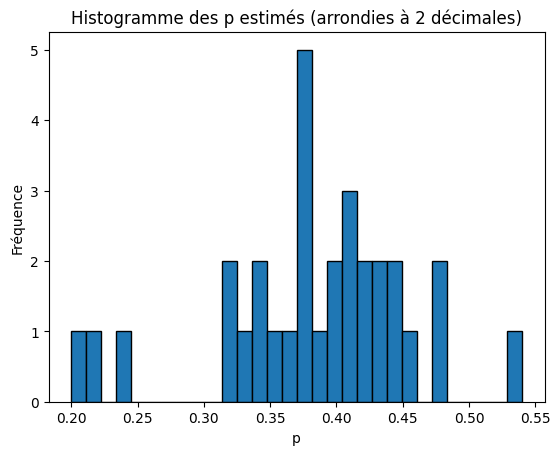

In [82]:
p_round = [round(x, 2) for x in px]
plt.hist(p_round, bins=30, edgecolor='black')
plt.xlabel("p")
plt.ylabel("Fréquence")
plt.title("Histogramme des p estimés (arrondies à 2 décimales)")
plt.show()

Enfin, le paramètre p est majoritiairement entre 0.32 et 0.45.

## 6. Conclusion

Ainsi, on a pu observer et prouver l'existence d'une loi géométrique sur la fréquence des noeuds en dessous de 12 enfants pour au moins un tier des graphes à notre disposition ($\frac{31}{110}$).

Cette loi géométrique se trouve entre les fréquence de noeuds à 3 et 12 enfants. La suite de valeurs peut varier en taille cependant. De plus le paramètre $p$ estimé de la loi se trouve le plus souvent entre 0.32 et 0.45.

Cette observation constitue alors une caractérisitque supplémentaire sur les enfants des noeuds des graphes de Git.